In [4]:
!pip install pandas matplotlib statsmodels plotly

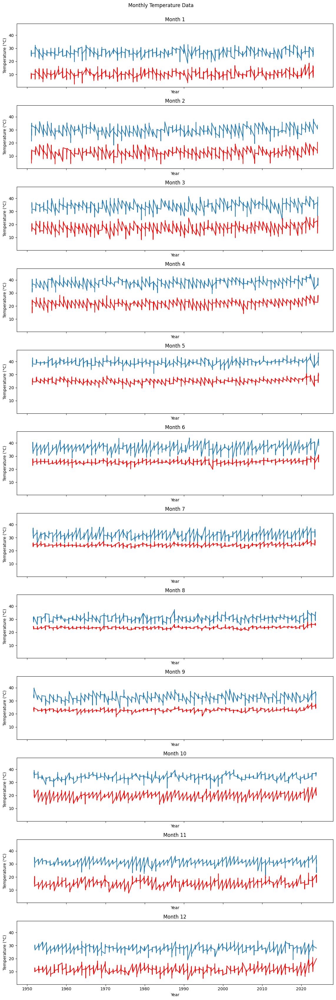

        Date  Forecast_Temp_Max  Forecast_Temp_Min
0 2024-06-30          32.937438          17.329195
1 2024-07-31          32.698373          17.454738
2 2024-08-31          32.499112          17.316445
3 2024-09-30          32.398437          17.248866
4 2024-10-31          32.418965          17.236464


<ipython-input-2-0c6915a38981>:87: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  future_dates = pd.date_range(start=end_date + pd.Timedelta(days=1), periods=240, freq='M')


In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.arima.model import ARIMA

# Function to load and preprocess the data
def load_and_preprocess_data(file_path):
    # Load the CSV file
    df = pd.read_csv(file_path)

    # Convert date column to datetime
    df['Date'] = pd.to_datetime(df['Date'], format='%d-%m-%Y')

    # Replace 'Tr' and other invalid entries with NaN and fill missing values
    df.replace({'Rain': {'Tr': np.nan, '-----': np.nan}}, inplace=True)
    df.replace({'Temp_Max': {'Tr': np.nan, '-----': np.nan},
                 'Temp_Min': {'Tr': np.nan, '-----': np.nan}}, inplace=True)

    # Convert numeric columns to floats
    df['Rain'] = pd.to_numeric(df['Rain'], errors='coerce')
    df['Temp_Max'] = pd.to_numeric(df['Temp_Max'], errors='coerce')
    df['Temp_Min'] = pd.to_numeric(df['Temp_Min'], errors='coerce')

    # Drop any rows with NaN values
    df.dropna(inplace=True)

    return df

# Function to plot each month separately for Temp_Max and Temp_Min
def plot_each_month_separately(df):
    months = range(1, 13)

    fig, axs = plt.subplots(nrows=12, ncols=1, figsize=(12, 36), sharex=True, sharey=True) # Changed to 1x12 grid
    fig.suptitle('Monthly Temperature Data')

    for i, month in enumerate(months):
        # No need to calculate row and column index anymore

        month_data = df[df['Date'].dt.month == month]

        axs[i].plot(month_data['Date'], month_data['Temp_Max'], label=f'Temp Max')
        axs[i].plot(month_data['Date'], month_data['Temp_Min'], label=f'Temp Min', color='red')

        axs[i].set_title(f'Month {month}')
        axs[i].set_xlabel('Year')
        axs[i].set_ylabel('Temperature (°C)')

    plt.tight_layout(rect=[0.04, 0.04, 1, 0.98])
    plt.show()

# Function to predict future temperatures using ARIMA
def predict_future_temperatures(df):
    # Split the data into train and test sets for Temp_Max and Temp_Min
    train_years = 50  # Using the last 50 years as training data
    train_size = int(len(df) * (train_years / 68))  # Assuming a total of 68 years in the dataset

    train_temp_max = df['Temp_Max'].iloc[:train_size]
    test_temp_max = df['Temp_Max'].iloc[train_size:]

    train_temp_min = df['Temp_Min'].iloc[:train_size]
    test_temp_min = df['Temp_Min'].iloc[train_size:]

    # Fit ARIMA model for Temp_Max
    try:
        model_temp_max = ARIMA(train_temp_max, order=(5, 1, 0))
        model_fit_temp_max = model_temp_max.fit()

        # Forecast for the next 240 months (20 years * 12 months/year)
        forecast_temp_max = model_fit_temp_max.forecast(steps=240).values
    except:
        print("ARIMA model failed to fit Temp_Max. Using moving average instead.")
        forecast_temp_max = train_temp_max.rolling(window=5, center=False).mean().iloc[-1:].repeat(240).values

    # Fit ARIMA model for Temp_Min
    try:
        model_temp_min = ARIMA(train_temp_min, order=(5, 1, 0))
        model_fit_temp_min = model_temp_min.fit()

        # Forecast for the next 240 months (20 years * 12 months/year)
        forecast_temp_min = model_fit_temp_min.forecast(steps=240).values
    except:
        print("ARIMA model failed to fit Temp_Min. Using moving average instead.")
        forecast_temp_min = train_temp_min.rolling(window=5, center=False).mean().iloc[-1:].repeat(240).values

    # Create a future date range for the predictions
    end_date = df['Date'].max()
    future_dates = pd.date_range(start=end_date + pd.Timedelta(days=1), periods=240, freq='M')

    return future_dates, forecast_temp_max, forecast_temp_min

# Load and preprocess data
file_path = '/content/amd-temp-rains.csv'  # Update this path to your CSV file
df = load_and_preprocess_data(file_path)

# Plot each month separately for Temp_Max and Temp_Min
plot_each_month_separately(df)

# Predict future temperatures using ARIMA
future_dates, forecast_temp_max, forecast_temp_min = predict_future_temperatures(df)

# Create a DataFrame with the predictions
predictions_df = pd.DataFrame({
    'Date': future_dates,
    'Forecast_Temp_Max': forecast_temp_max,
    'Forecast_Temp_Min': forecast_temp_min
})

print(predictions_df.head())


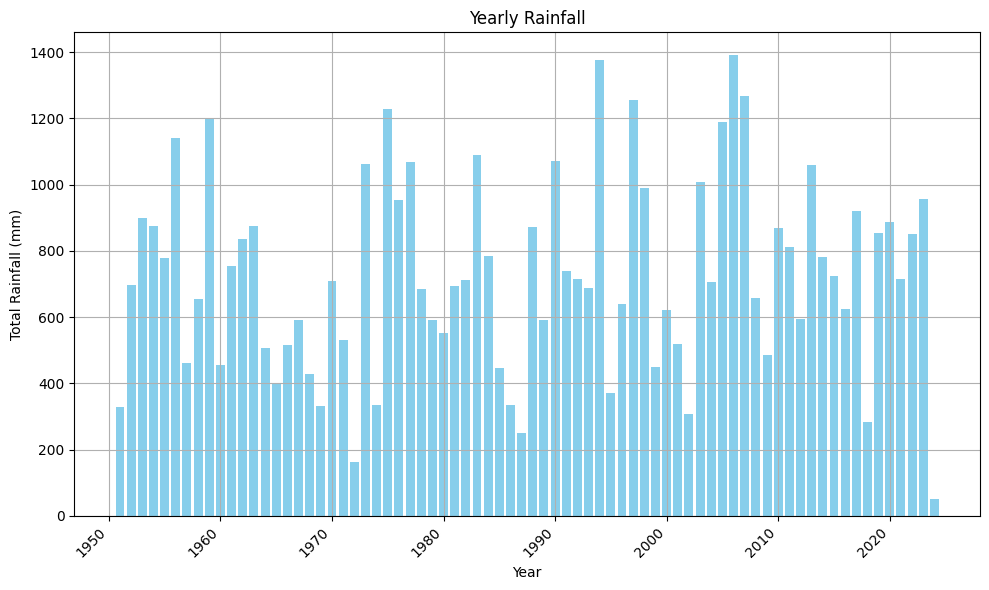

In [ ]:
# Group data by year and sum rainfall for each year
yearly_rainfall = df.groupby(df['Date'].dt.year)['Rain'].sum()

# Get the rainfall data for the last year
last_year_rainfall = yearly_rainfall.iloc[-1]

# Extract year and rainfall values for plotting
years = yearly_rainfall.index
rainfall_values = yearly_rainfall.values
plt.figure(figsize=(10, 6))  # Adjust figure size as needed
plt.bar(years, rainfall_values, color='skyblue')
plt.title('Yearly Rainfall')
plt.xlabel('Year')
plt.ylabel('Total Rainfall (mm)')
plt.grid(True)  # Add gridlines for better readability
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels if necessary
plt.tight_layout()  # Adjust layout to prevent labels from overlapping
plt.show()

In [5]:
import pandas as pd
import numpy as np
import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots
from statsmodels.tsa.arima.model import ARIMA
from pandas.tseries.offsets import MonthEnd  # Added import

# Function to load and preprocess the data
def load_and_preprocess_data(file_path):
    # Load the CSV file
    df = pd.read_csv(file_path)

    # Convert date column to datetime
    df['Date'] = pd.to_datetime(df['Date'], format='%d-%m-%Y')

    # Replace 'Tr' and other invalid entries with NaN
    df.replace({
        'Rain': {'Tr': np.nan, '-----': np.nan},
        'Temp_Max': {'Tr': np.nan, '-----': np.nan},
        'Temp_Min': {'Tr': np.nan, '-----': np.nan}
    }, inplace=True)

    # Convert numeric columns to floats
    df['Rain'] = pd.to_numeric(df['Rain'], errors='coerce')
    df['Temp_Max'] = pd.to_numeric(df['Temp_Max'], errors='coerce')
    df['Temp_Min'] = pd.to_numeric(df['Temp_Min'], errors='coerce')

    # Drop any rows with NaN values
    df.dropna(inplace=True)

    return df

# Function to plot each month separately for Temp_Max and Temp_Min using Plotly
def plot_each_month_separately(df):
    months = range(1, 13)

    # Create a subplot for each month
    fig = make_subplots(rows=6, cols=2, subplot_titles=[f'Month {month}' for month in months],
                        vertical_spacing=0.05, horizontal_spacing=0.05)

    for i, month in enumerate(months):
        row = i // 2 + 1
        col = i % 2 + 1
        month_data = df[df['Date'].dt.month == month]

        # Add Temp_Max trace
        fig.add_trace(
            go.Scatter(x=month_data['Date'], y=month_data['Temp_Max'],
                       mode='lines', name='Temp Max', line=dict(color='blue')),
            row=row, col=col
        )

        # Add Temp_Min trace
        fig.add_trace(
            go.Scatter(x=month_data['Date'], y=month_data['Temp_Min'],
                       mode='lines', name='Temp Min', line=dict(color='red')),
            row=row, col=col
        )

        # Update axes
        fig.update_xaxes(title_text="Year", row=row, col=col)
        fig.update_yaxes(title_text="Temperature (°C)", row=row, col=col)

    fig.update_layout(height=1800, width=1200, title_text="Monthly Temperature Data", showlegend=False)
    fig.show()

# Function to predict future temperatures using ARIMA and visualize forecasts
def predict_and_plot_forecasts(df):
    # Split the data into train and test sets for Temp_Max and Temp_Min
    train_years = 50  # Using the last 50 years as training data
    total_years = df['Date'].dt.year.nunique()
    train_size = train_years * 12  # Monthly data

    train_temp_max = df['Temp_Max'].iloc[:train_size]
    test_temp_max = df['Temp_Max'].iloc[train_size:]

    train_temp_min = df['Temp_Min'].iloc[:train_size]
    test_temp_min = df['Temp_Min'].iloc[train_size:]

    # Fit ARIMA model for Temp_Max
    try:
        model_temp_max = ARIMA(train_temp_max, order=(5, 1, 0))
        model_fit_temp_max = model_temp_max.fit()
        forecast_temp_max = model_fit_temp_max.forecast(steps=240).values
        confidence_max = model_fit_temp_max.get_forecast(steps=240).conf_int()
    except Exception as e:
        print(f"ARIMA model failed to fit Temp_Max: {e}. Using moving average instead.")
        forecast_temp_max = train_temp_max.rolling(window=5).mean().iloc[-1:].repeat(240).values
        confidence_max = pd.DataFrame({
            'lower Temp_Max': forecast_temp_max.flatten(),
            'upper Temp_Max': forecast_temp_max.flatten()
        })

    # Fit ARIMA model for Temp_Min
    try:
        model_temp_min = ARIMA(train_temp_min, order=(5, 1, 0))
        model_fit_temp_min = model_temp_min.fit()
        forecast_temp_min = model_fit_temp_min.forecast(steps=240).values
        confidence_min = model_fit_temp_min.get_forecast(steps=240).conf_int()
    except Exception as e:
        print(f"ARIMA model failed to fit Temp_Min: {e}. Using moving average instead.")
        forecast_temp_min = train_temp_min.rolling(window=5).mean().iloc[-1:].repeat(240).values
        confidence_min = pd.DataFrame({
            'lower Temp_Min': forecast_temp_min.flatten(),
            'upper Temp_Min': forecast_temp_min.flatten()
        })

    # Create a future date range for the predictions using MonthEnd()
    end_date = df['Date'].max()
    future_dates = pd.date_range(start=end_date + MonthEnd(), periods=240, freq=MonthEnd())

    # Create traces for Plotly
    fig = go.Figure()

    # Historical Temp_Max
    fig.add_trace(go.Scatter(x=df['Date'], y=df['Temp_Max'],
                             mode='lines', name='Temp Max Historical', line=dict(color='blue')))

    # Forecast Temp_Max
    fig.add_trace(go.Scatter(x=future_dates, y=forecast_temp_max,
                             mode='lines', name='Temp Max Forecast', line=dict(color='lightblue', dash='dash')))

    # Confidence Interval for Temp_Max
    fig.add_trace(go.Scatter(x=future_dates, y=confidence_max.iloc[:, 0],
                             mode='lines', name='Temp Max CI Lower', line=dict(color='lightblue', dash='dot')))
    fig.add_trace(go.Scatter(x=future_dates, y=confidence_max.iloc[:, 1],
                             mode='lines', name='Temp Max CI Upper', line=dict(color='lightblue', dash='dot'),
                             fill='tonexty', fillcolor='rgba(173,216,230,0.2)', showlegend=False))

    # Historical Temp_Min
    fig.add_trace(go.Scatter(x=df['Date'], y=df['Temp_Min'],
                             mode='lines', name='Temp Min Historical', line=dict(color='red')))

    # Forecast Temp_Min
    fig.add_trace(go.Scatter(x=future_dates, y=forecast_temp_min,
                             mode='lines', name='Temp Min Forecast', line=dict(color='lightcoral', dash='dash')))

    # Confidence Interval for Temp_Min
    fig.add_trace(go.Scatter(x=future_dates, y=confidence_min.iloc[:, 0],
                             mode='lines', name='Temp Min CI Lower', line=dict(color='lightcoral', dash='dot')))
    fig.add_trace(go.Scatter(x=future_dates, y=confidence_min.iloc[:, 1],
                             mode='lines', name='Temp Min CI Upper', line=dict(color='lightcoral', dash='dot'),
                             fill='tonexty', fillcolor='rgba(240,128,128,0.2)', showlegend=False))

    fig.update_layout(title='Temperature Forecasts with ARIMA',
                      xaxis_title='Date',
                      yaxis_title='Temperature (°C)',
                      template='plotly_white')
    fig.show()

    # Create a DataFrame with the predictions
    predictions_df = pd.DataFrame({
        'Date': future_dates,
        'Forecast_Temp_Max': forecast_temp_max,
        'Forecast_Temp_Min': forecast_temp_min
    })

    print(predictions_df.head())

# Function to add additional visualizations
def additional_visualizations(df):
    # 1. Seasonal Decomposition
    import statsmodels.api as sm
    decomposition_max = sm.tsa.seasonal_decompose(df.set_index('Date')['Temp_Max'], model='additive', period=12)
    decomposition_min = sm.tsa.seasonal_decompose(df.set_index('Date')['Temp_Min'], model='additive', period=12)

    fig = make_subplots(rows=2, cols=1, subplot_titles=['Seasonal Decomposition of Temp_Max', 'Seasonal Decomposition of Temp_Min'])

    # Add Temp_Max decomposition
    fig.add_trace(go.Scatter(x=decomposition_max.trend.index, y=decomposition_max.trend,
                             mode='lines', name='Trend'), row=1, col=1)
    fig.add_trace(go.Scatter(x=decomposition_max.seasonal.index, y=decomposition_max.seasonal,
                             mode='lines', name='Seasonal'), row=1, col=1)
    fig.add_trace(go.Scatter(x=decomposition_max.resid.index, y=decomposition_max.resid,
                             mode='lines', name='Residual'), row=1, col=1)

    # Add Temp_Min decomposition
    fig.add_trace(go.Scatter(x=decomposition_min.trend.index, y=decomposition_min.trend,
                             mode='lines', name='Trend'), row=2, col=1)
    fig.add_trace(go.Scatter(x=decomposition_min.seasonal.index, y=decomposition_min.seasonal,
                             mode='lines', name='Seasonal'), row=2, col=1)
    fig.add_trace(go.Scatter(x=decomposition_min.resid.index, y=decomposition_min.resid,
                             mode='lines', name='Residual'), row=2, col=1)

    fig.update_layout(height=800, width=1200, title_text="Seasonal Decomposition")
    fig.show()

    # 2. Correlation Heatmap
    corr = df[['Rain', 'Temp_Max', 'Temp_Min']].corr()
    fig = px.imshow(corr, text_auto=True,
                    x=corr.columns, y=corr.columns,
                    color_continuous_scale='RdBu_r', range_color=[-1,1],
                    title='Correlation Heatmap')
    fig.show()

    # 3. Rain vs Temperature Scatter Plot
    fig = px.scatter(df, x='Rain', y='Temp_Max', trendline='ols',
                     title='Rain vs Temp_Max',
                     labels={'Rain': 'Rain (mm)', 'Temp_Max': 'Maximum Temperature (°C)'})
    fig.show()

    fig = px.scatter(df, x='Rain', y='Temp_Min', trendline='ols',
                     title='Rain vs Temp_Min',
                     labels={'Rain': 'Rain (mm)', 'Temp_Min': 'Minimum Temperature (°C)'})
    fig.show()

    # 4. Heatmap of Average Temperatures by Month and Year
    df['Year'] = df['Date'].dt.year
    df['Month'] = df['Date'].dt.month
    pivot_max = df.pivot_table(values='Temp_Max', index='Month', columns='Year', aggfunc='mean')
    pivot_min = df.pivot_table(values='Temp_Min', index='Month', columns='Year', aggfunc='mean')

    fig = make_subplots(rows=2, cols=1, subplot_titles=['Average Temp_Max Heatmap', 'Average Temp_Min Heatmap'])

    # Temp_Max Heatmap
    fig.add_trace(go.Heatmap(z=pivot_max.values,
                             x=pivot_max.columns,
                             y=pivot_max.index,
                             colorscale='Viridis',
                             colorbar=dict(title='Temp Max (°C)')),
                  row=1, col=1)

    # Temp_Min Heatmap
    fig.add_trace(go.Heatmap(z=pivot_min.values,
                             x=pivot_min.columns,
                             y=pivot_min.index,
                             colorscale='Viridis',
                             colorbar=dict(title='Temp Min (°C)')),
                  row=2, col=1)

    fig.update_layout(height=800, width=1200, title_text="Average Temperatures Heatmaps")
    fig.show()

    # 5. Interactive Dashboard with Plotly Dash (Optional)
    # If you want to create an interactive dashboard, consider using Dash.
    # Here's a simple example structure (commented out):

    """
    import dash
    from dash import dcc, html
    from dash.dependencies import Input, Output

    app = dash.Dash(__name__)

    app.layout = html.Div([
        html.H1("Weather Data Dashboard"),
        dcc.Dropdown(
            id='month-dropdown',
            options=[{'label': f'Month {m}', 'value': m} for m in range(1,13)],
            value=1
        ),
        dcc.Graph(id='monthly-temp-graph'),
        # Add more interactive components as needed
    ])

    @app.callback(
        Output('monthly-temp-graph', 'figure'),
        [Input('month-dropdown', 'value')]
    )
    def update_graph(selected_month):
        month_data = df[df['Date'].dt.month == selected_month]
        fig = go.Figure()
        fig.add_trace(go.Scatter(x=month_data['Date'], y=month_data['Temp_Max'],
                                 mode='lines', name='Temp Max'))
        fig.add_trace(go.Scatter(x=month_data['Date'], y=month_data['Temp_Min'],
                                 mode='lines', name='Temp Min'))
        fig.update_layout(title=f'Temperatures for Month {selected_month}',
                          xaxis_title='Date',
                          yaxis_title='Temperature (°C)')
        return fig

    if __name__ == '__main__':
        app.run_server(debug=True)
    """

# Main Execution
if __name__ == "__main__":
    # Load and preprocess data
    file_path = '/content/amd-temp-rains.csv'  # Update this path to your CSV file
    df = load_and_preprocess_data(file_path)

    # Plot each month separately for Temp_Max and Temp_Min using Plotly
    plot_each_month_separately(df)

    # Predict future temperatures using ARIMA and visualize forecasts
    predict_and_plot_forecasts(df)

    # Additional Visualizations
    additional_visualizations(df)

        Date  Forecast_Temp_Max  Forecast_Temp_Min
0 2024-06-30          30.066018          23.671534
1 2024-07-31          30.020544          23.584391
2 2024-08-31          29.931971          23.463964
3 2024-09-30          29.863577          23.484182
4 2024-10-31          29.843418          23.466933
